## CS 445: Computational Photography

## Programming Project #3: Gradient Domain Fusion

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy
import scipy.sparse.linalg
import utils

## Part 1 Toy Problem (20 pts)

In [74]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    
    im_h, im_w = img.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w) 
    
    neq = im_h * (im_w-1) + (im_h-1) * im_w + 1
    A = scipy.sparse.lil_matrix((neq, im_h * im_w), dtype='double')
    b = np.zeros((neq, 1), dtype='double')

    e = 0
    
    for y in range(im_w):
        for x in range(im_h - 1):
            A[e, im2var[x+1, y]] = 1
            A[e, im2var[x, y]] = -1
            b[e] = img[x+1, y] - img[x, y]
            e += 1

    
    for y in range(im_w - 1):
        for x in range(im_h):
            A[e, im2var[x, y+1]] = 1
            A[e, im2var[x, y]] = -1
            b[e] = img[x, y+1] - img[x, y]
            e += 1

    A[e, im2var[0, 0]] = 1
    b[e] = img[0, 0] 

    v = scipy.sparse.linalg.lsqr(A.tocsr(), b) # solve w/ csr

    im_re = np.zeros((im_h, im_w), dtype='double')
    for x in range(im_h):
        for y in range(im_w):
            im_re[x, y] = v[0][im2var[x, y]]
    
    return im_re


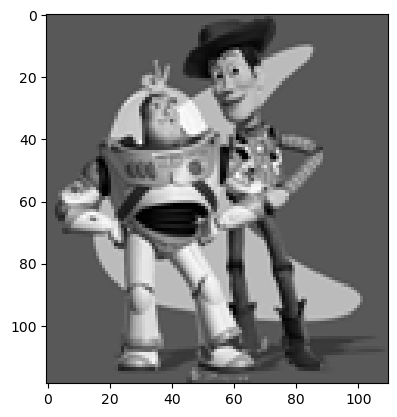

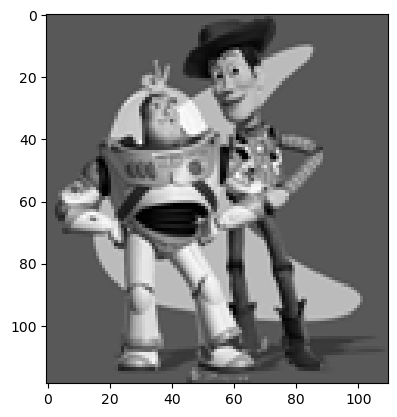

Max error is:  8.07367729038777e-06


In [344]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")
plt.show()

im_out = toy_reconstruct(toy_img)
plt.imshow(im_out, cmap="gray")
plt.show()
print("Max error is: ", np.sqrt(((im_out - toy_img)**2).max()))

## Preparation

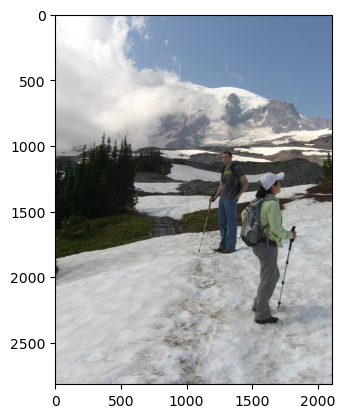

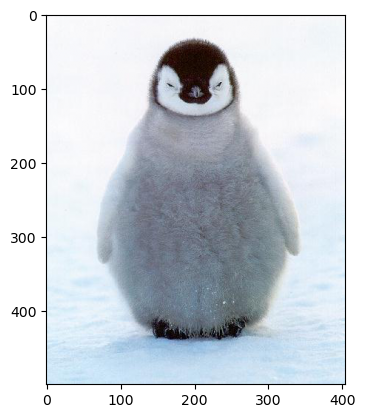

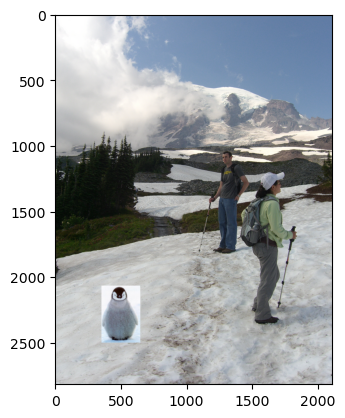

In [220]:
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

use_interface = False  # set to true if you want to use the interface to choose points (might not work in Colab)
if not use_interface:
    xs = (65, 359, 359, 65)
    ys = (24, 24, 457, 457)
    object_mask = utils.get_mask(ys, xs, object_img)
    bottom_center = (500, 2500) # (x,y)

    object_img, object_mask = utils.crop_object_img(object_img, object_mask)
    bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
    plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

In [149]:
if use_interface:
    import matplotlib.pyplot as plt
    %matplotlib notebook
    mask_coords = specify_mask(object_img)

In [150]:
if use_interface:
    xs = mask_coords[0]
    ys = mask_coords[1]
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.figure()
    object_mask = get_mask(ys, xs, object_img)

In [151]:
if use_interface:
    %matplotlib notebook
    import matplotlib.pyplot as plt
    bottom_center = specify_bottom_center(background_img)
    %matplotlib inline
    import matplotlib.pyplot as plt

    object_img, object_mask = utils.crop_object_img(object_img, object_mask)
    bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
    plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

## Part 2 Poisson Blending (50 pts)

In [52]:
def poisson_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a Poisson blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    
    # extract the background patch that overlaps with the aligned object image
    bg = bg_img.copy()
    x, y = bg_ul[0], bg_ul[1]
    h, w = object_img.shape
    img = bg[x:x+h, y:y+w]
    
    im_h, im_w = img.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w) 
    
    # for each pixel where mask == 1 4 eqns else 1 per pixel
    nz = np.count_nonzero(object_mask == 1)
    neq = 4 * nz + len(object_mask) - nz
    
    # initialize linear equation matrices A and b
    A = scipy.sparse.lil_matrix((neq, im_h * im_w), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    
    # calculate poisson blending
    e = 0    
    
    for y in range(w):
        for x in range(h - 1):
            e += 1
            if object_mask[x, y] == 1:
                A[e, im2var[x+1, y]] = 1
                A[e, im2var[x, y]] = -1
                b[e] = object_img[x+1, y] - object_img[x, y]
            else:
                A[e, im2var[x+1, y]] = 1
                b[e] = object_img[x+1, y] - object_img[x, y] + img[x, y]

    for y in range(w - 1):
        for x in range(h):
            e += 1
            if object_mask[x, y] == 1:
                A[e, im2var[x, y+1]] = 1
                A[e, im2var[x, y]] = -1
                b[e] = object_img[x, y+1] - object_img[x, y]
            else:
                A[e, im2var[x, y+1]] = 1
                b[e] = object_img[x, y+1] - object_img[x, y] + img[x, y]

    v = scipy.sparse.linalg.lsqr(A.tocsr(), b) # solve w/ csr
    
    # modify the patch
    for x in range(im_h):
        for y in range(im_w):
            img[x, y] = v[0][im2var[x, y]]
    
    # copy the patch back into the background image 
    x, y = bg_ul[0], bg_ul[1]
    bg_img[x:x+im_h, y:y+im_w] = img
    
    return bg_img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


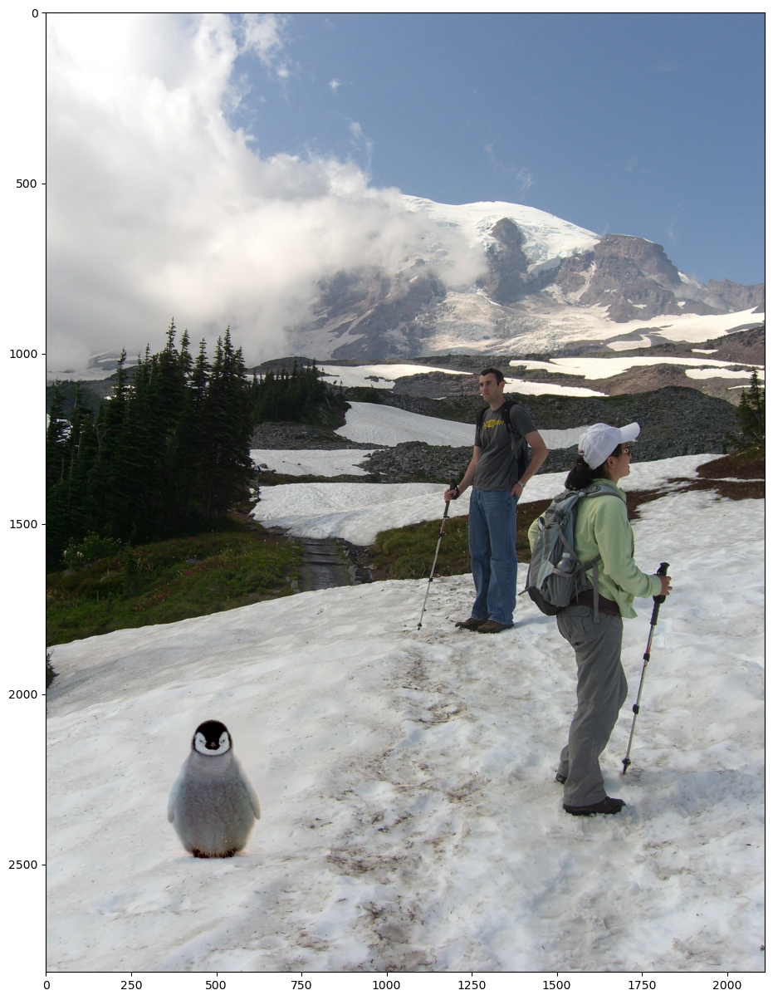

In [429]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

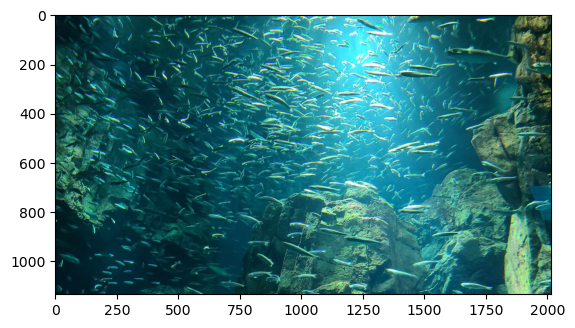

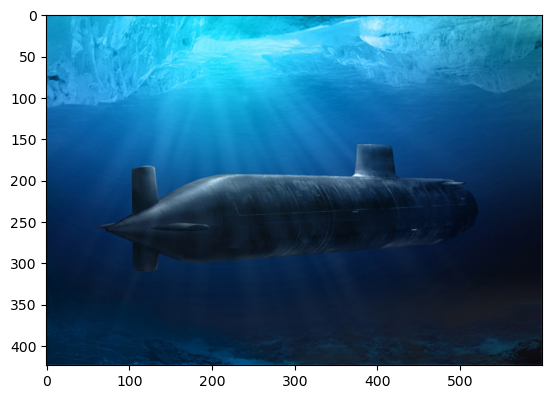

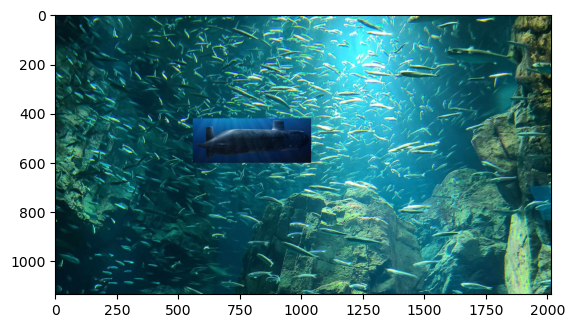

In [440]:
background_img = cv2.cvtColor(cv2.imread('aquarium.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('submarine.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

xs = (50, 530, 530, 50)
ys = (150, 150, 330, 330)
object_mask = utils.get_mask(ys, xs, object_img)
bottom_center = (800, 600) # (x,y)

object_img, object_mask = utils.crop_object_img(object_img, object_mask)
bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


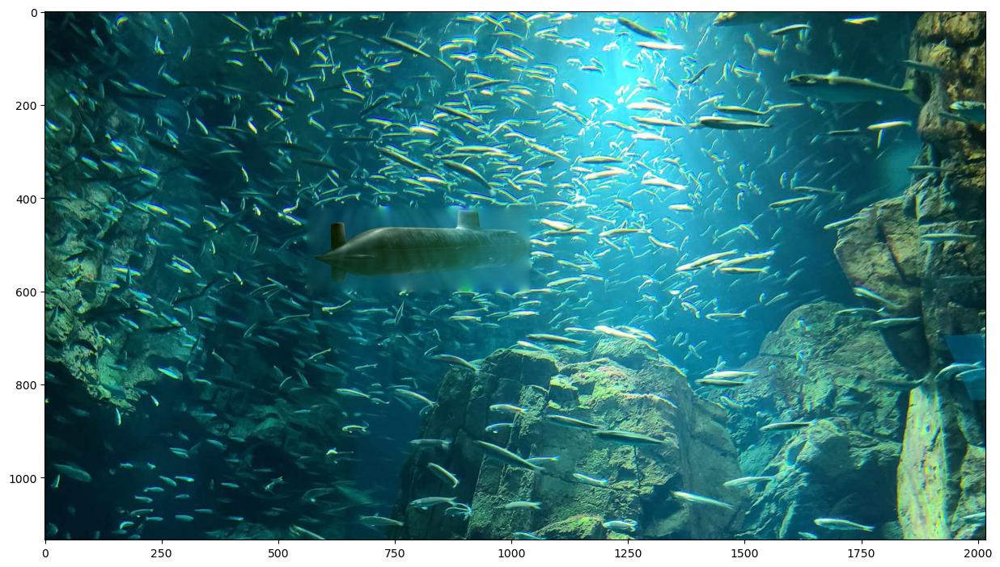

In [441]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

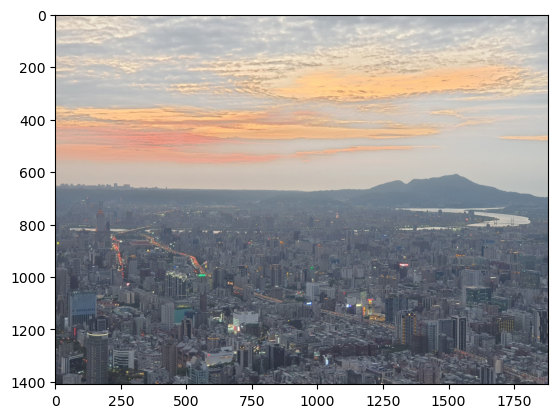

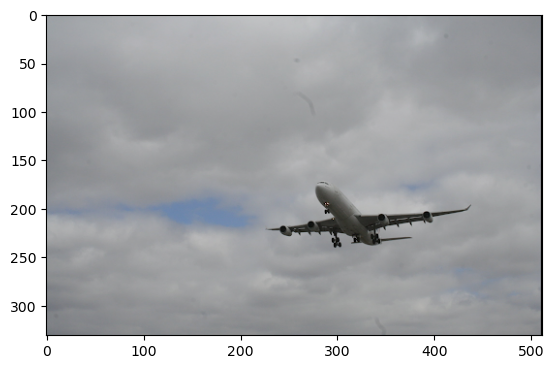

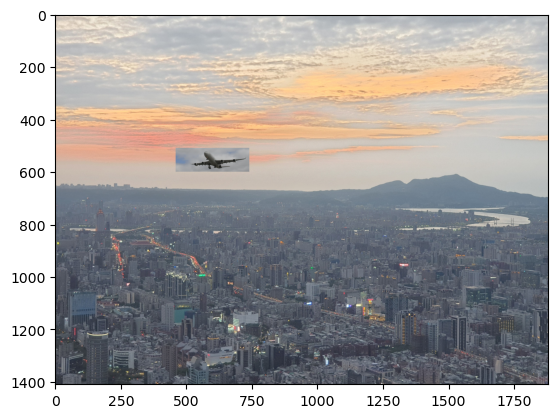

In [451]:
background_img = cv2.cvtColor(cv2.imread('101.PNG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('plane.PNG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

xs = (170, 450, 450, 170)
ys = (160, 160, 250, 250)
object_mask = utils.get_mask(ys, xs, object_img)
bottom_center = (600, 600) # (x,y)

object_img, object_mask = utils.crop_object_img(object_img, object_mask)
bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

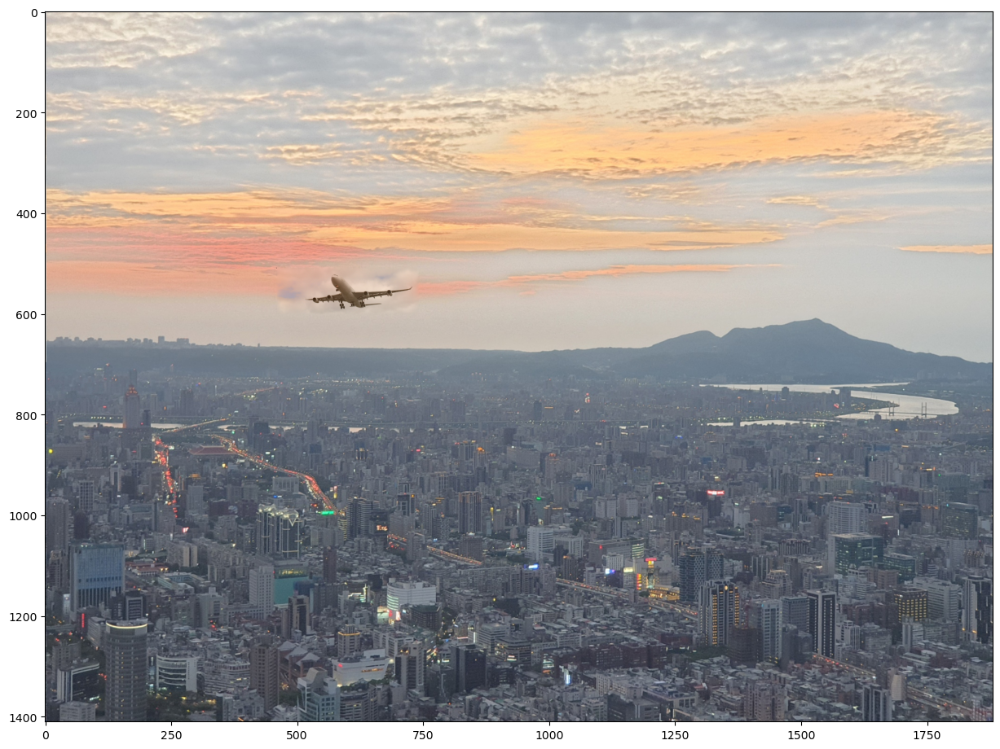

In [452]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

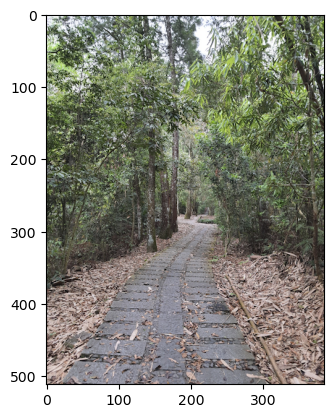

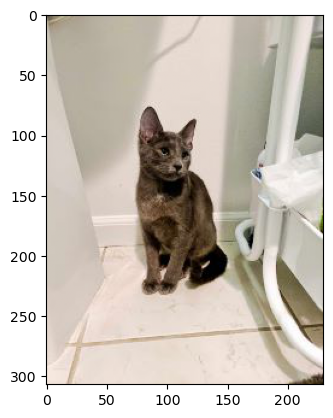

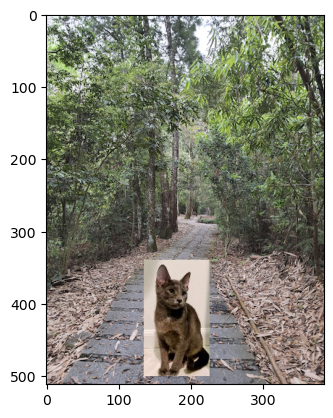

In [472]:
background_img = cv2.cvtColor(cv2.imread('path.PNG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('misha.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

xs = (60, 150, 150, 60)
ys = (70, 70, 230, 230)
object_mask = utils.get_mask(ys, xs, object_img)
bottom_center = (180, 500) # (x,y)

object_img, object_mask = utils.crop_object_img(object_img, object_mask)
bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


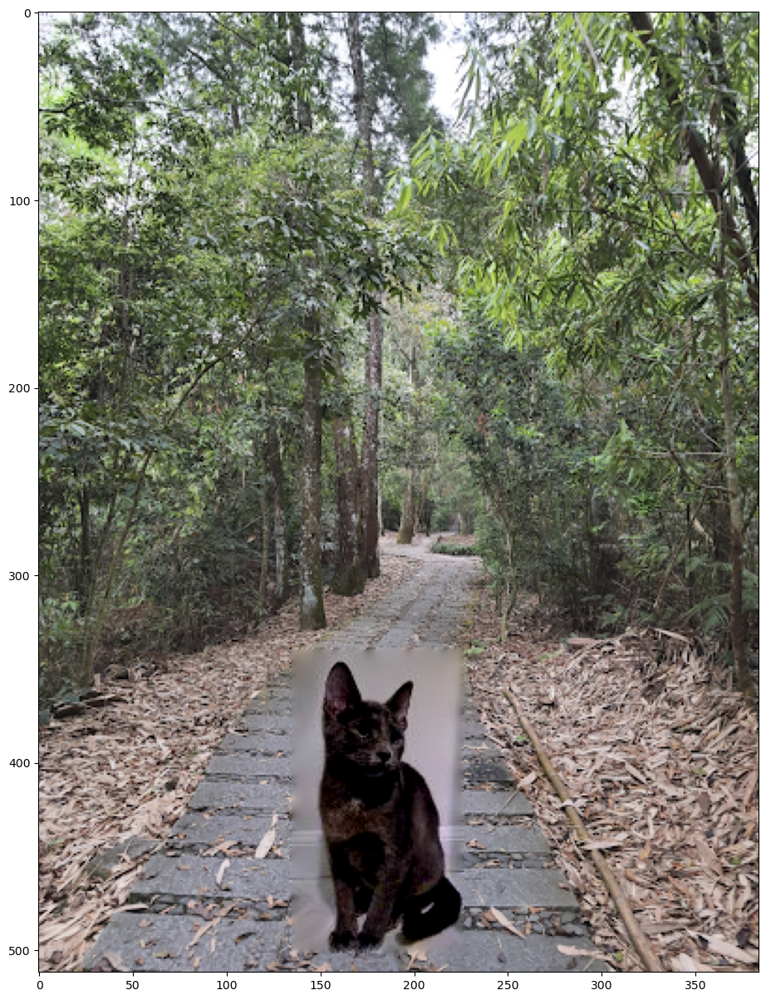

In [473]:
im_blend = np.zeros(background_img.shape)
for b in np.arange(3):
    im_blend[:,:,b] = poisson_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_blend)

## Part 3 Mixed Gradients (20 pts)

In [68]:
def mixed_blend(object_img, object_mask, bg_img, bg_ul):
    """
    Returns a mixed gradient blended image with masked object_img over the bg_img at position specified by bg_ul.
    Can be implemented to operate on a single channel or multiple channels
    :param object_img: the image containing the foreground object
    :param object_mask: the mask of the foreground object in object_img
    :param background_img: the background image 
    :param bg_ul: position (row, col) in background image corresponding to (0,0) of object_img 
    """
    
    # extract the background patch that overlaps with the aligned object image
    bg = bg_img.copy()
    x, y = bg_ul[0], bg_ul[1]
    h, w = object_img.shape
    img = bg[x:x+h, y:y+w]
    
    im_h, im_w = img.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w) 
    
    # for each pixel where mask == 1 4 eqns else 1 per pixel
    nz = np.count_nonzero(object_mask == 1)
    neq = 4 * nz + len(object_mask) - nz
    
    # initialize linear equation matrices A and b
    A = scipy.sparse.lil_matrix((neq, im_h * im_w), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    
    # calculate poisson blending
    e = 0    
    
    for y in range(w):
        for x in range(h - 1):
            e += 1
            A[e, im2var[x+1, y]] = 1

            # compare gradient magnitudes from source and target
            d_source = object_img[x+1, y] - object_img[x, y]
            d_target = img[x+1, y] - img[x, y]

            if object_mask[x, y] == 1:
                A[e, im2var[x, y]] = -1
                b[e] = max([d_source, d_target], key=abs)
            else:
                b[e] = max([d_source, d_target], key=abs) + img[x, y]
            
    for y in range(w - 1):
        for x in range(h):
            e += 1
            A[e, im2var[x, y+1]] = 1
            
            # compare gradient magnitudes from source and target
            d_source = object_img[x, y+1] - object_img[x, y]
            d_target = img[x, y+1] - img[x, y]
            
            if object_mask[x, y] == 1:
                A[e, im2var[x, y]] = -1
                b[e] = max([d_source, d_target], key=abs)
            else:
                b[e] = max([d_source, d_target], key=abs) + img[x, y]
                       
    v = scipy.sparse.linalg.lsqr(A.tocsr(), b) # solve w/ csr
    
    # modify the patch
    for x in range(im_h):
        for y in range(im_w):
            img[x, y] = v[0][im2var[x, y]]
    
    # copy the patch back into the background image 
    x, y = bg_ul[0], bg_ul[1]
    bg_img[x:x+im_h, y:y+im_w] = img
    
    return bg_img

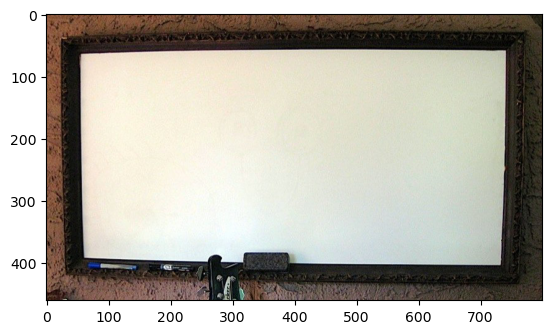

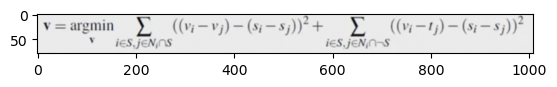

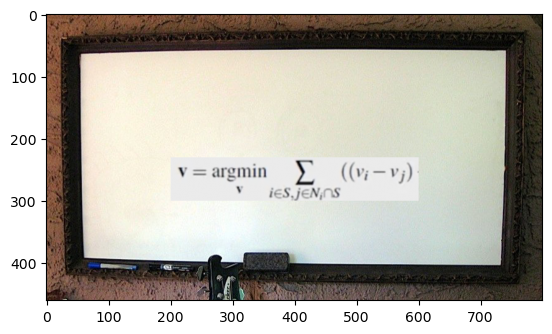

In [69]:
background_img = cv2.cvtColor(cv2.imread('whiteboard.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)
plt.show()
object_img = cv2.cvtColor(cv2.imread('eqn.PNG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.imshow(object_img)
plt.show()

xs = (1, 400, 400, 1)
ys = (1, 1, 70, 70)
object_mask = utils.get_mask(ys, xs, object_img)
bottom_center = (400, 300) # (x,y)

object_img, object_mask = utils.crop_object_img(object_img, object_mask)
bg_ul = utils.upper_left_background_rc(object_mask, bottom_center)
plt.imshow(utils.get_combined_img(background_img, object_img, object_mask, bg_ul))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


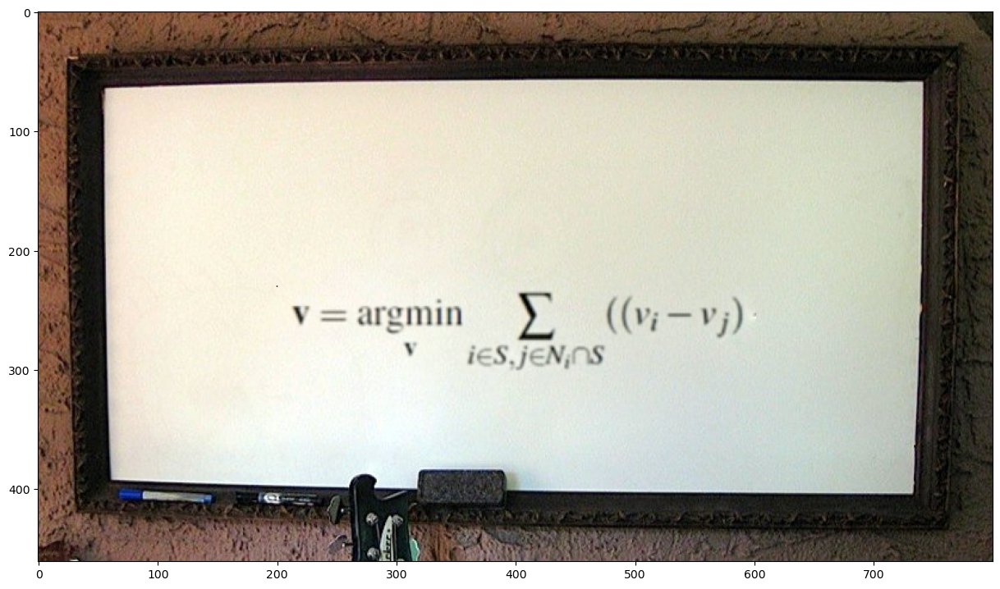

In [70]:
im_mix = np.zeros(background_img.shape)
for b in np.arange(3):
    im_mix[:,:,b] = mixed_blend(object_img[:,:,b], object_mask, background_img[:,:,b].copy(), bg_ul)

plt.figure(figsize=(15,15))
plt.imshow(im_mix)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [135]:
def color2gray(img):
    
    gray = cv2.cvtColor(np.float32(img), cv2.COLOR_BGR2GRAY).astype('double') / 255.0
    mask = np.zeros_like(gray)
    mask[gray != 0] = 1 
    
    im_h, im_w, _ = img.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    
    im_re = mask
    
    nz = np.count_nonzero(mask == 1)
    neq = 4 * nz + len(mask) - nz
    
    # initialize linear equation matrices A and b
    A = scipy.sparse.lil_matrix((neq, im_h * im_w), dtype='double')
    b = np.zeros((neq, 1), dtype='double')
    
    e = 0    
    
    for y in range(im_w):
        for x in range(im_h - 1):
            A[e, im2var[x+1, y]] = 1

            # compare gradient magnitudes from source and target
            im_r, im_g, im_b = img[:,:,0], img[:,:,1], img[:,:,2]
            
            d_r = im_r[x+1, y] - im_r[x, y]
            d_g = im_g[x+1, y] - im_g[x, y]
            d_b = im_b[x+1, y] - im_b[x, y]
            
            if mask[x, y] == 1:
                A[e, im2var[x, y]] = -1
                b[e] = max([d_r, d_g, d_b], key=abs) + gray[x, y]
            
#             print(d_r, d_g, d_b, b[e])
            e += 1
    
    for y in range(im_w - 1):
        for x in range(im_h):
            A[e, im2var[x, y+1]] = 1
           
            # compare gradient magnitudes between channels
            im_r, im_g, im_b = img[:,:,0], img[:,:,1], img[:,:,2]
            d_r = im_r[x, y+1] - im_r[x, y]
            d_g = im_g[x, y+1] - im_g[x, y]
            d_b = im_b[x, y+1] - im_b[x, y]

            if mask[x, y] == 1:
                A[e, im2var[x, y]] = -1
                b[e] = max([d_r, d_g, d_b], key=abs) + gray[x, y]
            e += 1
                 
    v = scipy.sparse.linalg.lsqr(A.tocsr(), b) # solve w/ csr
    
    # modify the patch
    for x in range(im_h):
        for y in range(im_w):
            im_re[x, y] = v[0][im2var[x, y]]

    return im_re

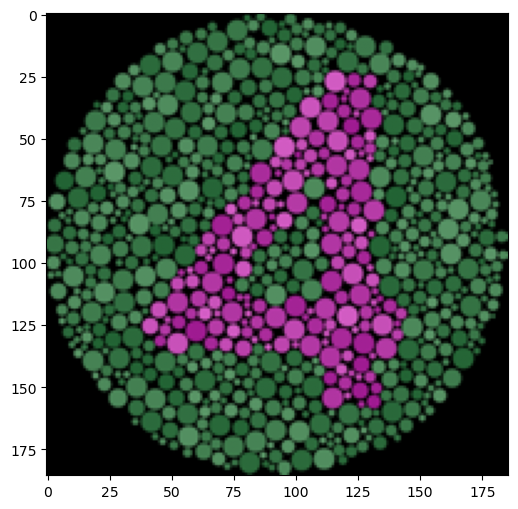

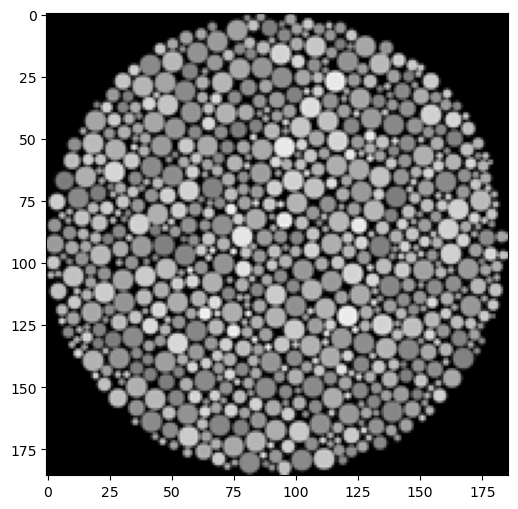

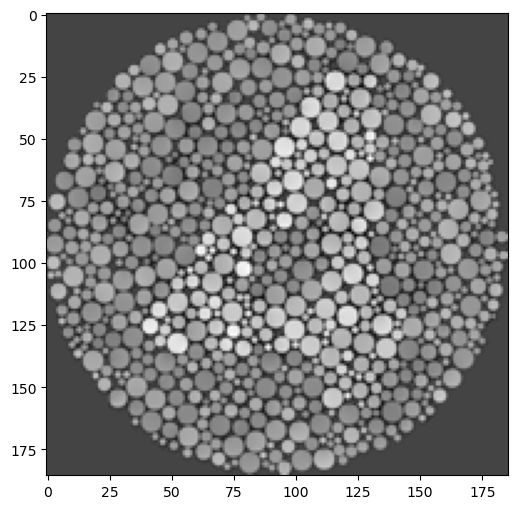

In [136]:
cb4 = cv2.cvtColor(cv2.imread('samples/colorBlind4.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure(figsize=(6,6))
plt.imshow(cb4)

gray = cv2.cvtColor(cv2.imread('samples/colorBlind4.png'), cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap="gray")

im_re4 = color2gray(cb4)
plt.figure(figsize=(6,6))
plt.imshow(im_re4, cmap="gray")

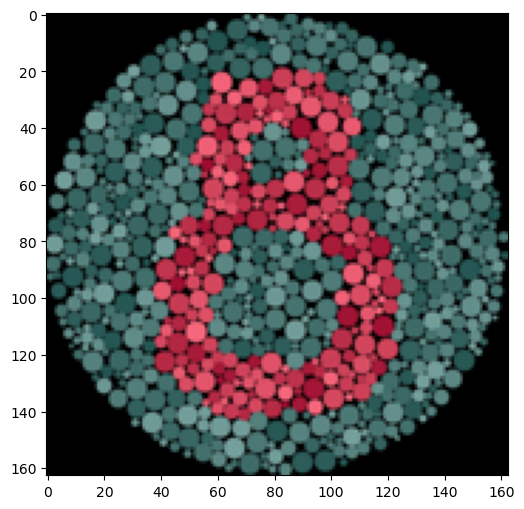

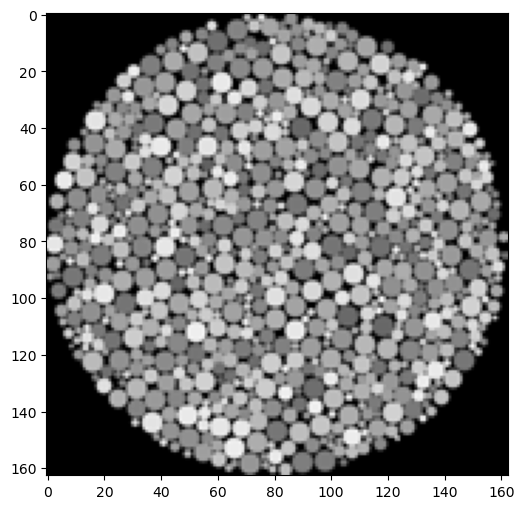

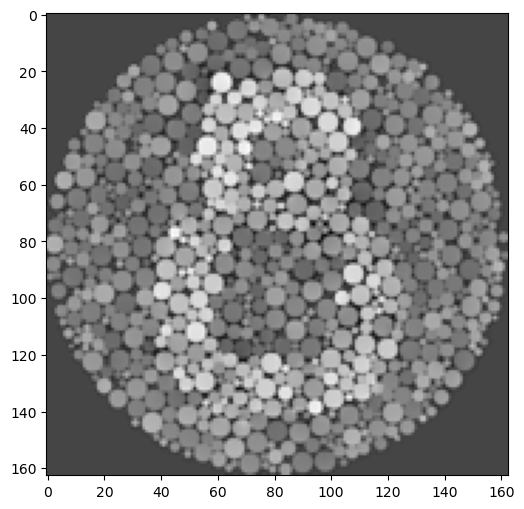

In [138]:
cb8 = cv2.cvtColor(cv2.imread('samples/colorBlind8.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure(figsize=(6,6))
plt.imshow(cb8)

gray = cv2.cvtColor(cv2.imread('samples/colorBlind8.png'), cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(6,6))
plt.imshow(gray.astype('double') / 255.0, cmap="gray")

mask = np.zeros_like(gray)
mask[gray != 0] = 1
im_re8 = color2gray(cb8)
plt.figure(figsize=(6,6))
plt.imshow(im_re8, cmap="gray")

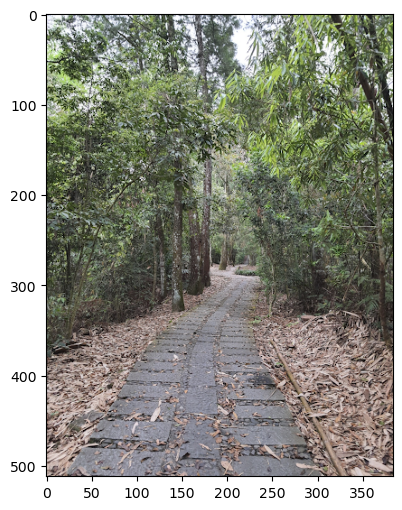

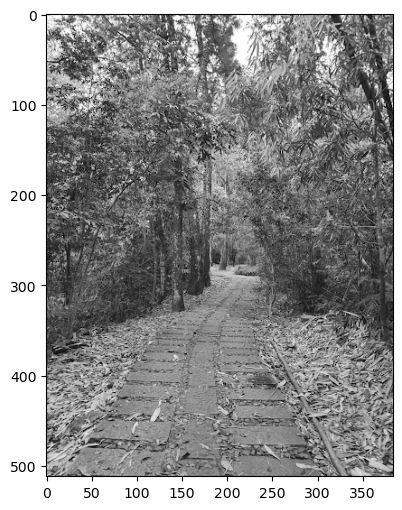

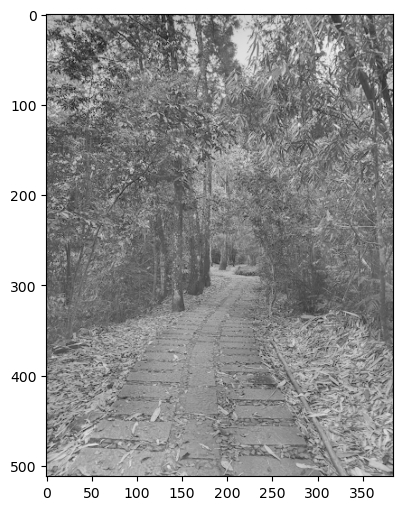

In [140]:
path = cv2.cvtColor(cv2.imread('path.png'), cv2.COLOR_BGR2RGB).astype('double') / 255.0
plt.figure(figsize=(6,6))
plt.imshow(path)

gray = cv2.cvtColor(cv2.imread('path.png'), cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(6,6))
plt.imshow(gray, cmap="gray")

im_path = color2gray(path)
plt.figure(figsize=(6,6))
plt.imshow(im_path, cmap="gray")

## Laplacian pyramid blending (20 pts)

In [ ]:
def laplacian_blend(object_img, object_mask, bg_img, bg_ul):
  # feel free to change input parameters
    pass

## More gradient domain processing (up to 20 pts)